In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Hugging Face

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face


In [ ]:
import os

# Change this path to your target folder in Drive
dataset_dir = '/content/gdrive/MyDrive/Hugging Face/datasets/MinneApple'

os.makedirs(dataset_dir, exist_ok=True)

# Download the dataset tarball (replace with actual URL)
!wget -O minneapple.tar.gz https://conservancy.umn.edu/bitstreams/3ef26f04-6467-469b-9857-f443ffa1bb61/download

# Extract
!tar -tf minneapple.tar.gz | head -3

# ✅ Extract directly into the datasets folder (not nested again)
!tar -xzf minneapple.tar.gz -C "$dataset_dir"

print("MinneApple dataset downloaded and extracted to", dataset_dir)

--2025-07-08 10:56:01--  https://conservancy.umn.edu/bitstreams/3ef26f04-6467-469b-9857-f443ffa1bb61/download
Resolving conservancy.umn.edu (conservancy.umn.edu)... 134.84.72.217
Connecting to conservancy.umn.edu (conservancy.umn.edu)|134.84.72.217|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://conservancy.umn.edu/server/api/core/bitstreams/3ef26f04-6467-469b-9857-f443ffa1bb61/content [following]
--2025-07-08 10:56:02--  https://conservancy.umn.edu/server/api/core/bitstreams/3ef26f04-6467-469b-9857-f443ffa1bb61/content
Reusing existing connection to conservancy.umn.edu:443.
HTTP request sent, awaiting response... 200 200
Length: unspecified [application/gzip]
Saving to: ‘minneapple.tar.gz’

minneapple.tar.gz       [              <=>   ]   1.70G  30.3MB/s    in 60s     

2025-07-08 10:57:02 (29.0 MB/s) - ‘minneapple.tar.gz’ saved [1825397590]

detection/test/images/dataset2_back_630.png
detection/train/masks/20150919_174151_image11.png
detection/t

In [ ]:
!mkdir -p "/content/gdrive/MyDrive/Hugging Face/datasets/MinneApple"
!ls "/content/gdrive/MyDrive/Hugging Face/datasets/MinneApple"

best_retinanet_model.pth  detection


In [2]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("datasets/MinneApple/detection/train_split/images")
count_images("datasets/MinneApple/detection/train_split/masks")
count_images("datasets/MinneApple/detection/test/images")

Total images: 536
Total images: 536
Total images: 331


In [ ]:
import os
import shutil
import random
from tqdm import tqdm

# === CONFIG ===
ROOT_DIR = "/content/gdrive/MyDrive/Hugging Face/datasets/MinneApple/detection"
IMAGE_DIR = os.path.join(ROOT_DIR, "train/images")
MASK_DIR = os.path.join(ROOT_DIR, "train/masks")
SPLIT_DIR = ROOT_DIR  # train_split/ and val_split/ will go here

SPLIT_RATIO = 0.8
SEED = 42

# === Step 1: Collect image filenames ===
all_images = [f for f in os.listdir(IMAGE_DIR) if f.endswith((".png", ".jpg", ".jpeg"))]
all_images.sort()
random.seed(SEED)
random.shuffle(all_images)

split_idx = int(len(all_images) * SPLIT_RATIO)
train_files = all_images[:split_idx]
val_files = all_images[split_idx:]

print(f"Train: {len(train_files)} images, Val: {len(val_files)} images")

# === Step 2: Prepare folders ===
for split in ["train_split", "val_split"]:
    os.makedirs(os.path.join(SPLIT_DIR, split, "images"), exist_ok=True)
    os.makedirs(os.path.join(SPLIT_DIR, split, "masks"), exist_ok=True)

# === Step 3: Move images and masks ===
def move_image_and_masks(file_list, split_name):
    for img_file in tqdm(file_list, desc=f"Moving {split_name}"):
        base = os.path.splitext(img_file)[0]
        img_path = os.path.join(IMAGE_DIR, img_file)
        mask_path = os.path.join(MASK_DIR, base + ".png")

        shutil.move(img_path, os.path.join(SPLIT_DIR, split_name, "images", img_file))
        shutil.move(mask_path, os.path.join(SPLIT_DIR, split_name, "masks", base + ".png"))

move_image_and_masks(train_files, "train_split")
move_image_and_masks(val_files, "val_split")

Train: 0 images, Val: 0 images


Moving train_split: 0it [00:00, ?it/s]
Moving val_split: 0it [00:00, ?it/s]


In [ ]:
import os
import json
import cv2
import numpy as np
from tqdm import tqdm

SPLIT_DIR = "/content/gdrive/MyDrive/Hugging Face/datasets/MinneApple/detection"
CATEGORY_NAME = "apple"

def masks_to_coco_from_grayscale_instances(split_name, save_path):
    image_folder = os.path.join(SPLIT_DIR, split_name, "images")
    mask_folder = os.path.join(SPLIT_DIR, split_name, "masks")

    coco = {
        "images": [],
        "annotations": [],
        "categories": [{"id": 1, "name": CATEGORY_NAME}]
    }

    ann_id = 1
    image_files = sorted(os.listdir(image_folder))
    for img_id, img_file in enumerate(tqdm(image_files, desc=f"COCO for {split_name}")):
        img_path = os.path.join(image_folder, img_file)
        height, width = cv2.imread(img_path).shape[:2]

        coco["images"].append({
            "id": img_id,
            "file_name": img_file,
            "width": width,
            "height": height
        })

        base = os.path.splitext(img_file)[0]
        mask_path = os.path.join(mask_folder, base + ".png")
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)  # preserve original values

        if mask is None or mask.max() == 0:
            continue

        instance_ids = np.unique(mask)
        instance_ids = instance_ids[instance_ids != 0]  # ignore background

        for inst_id in instance_ids:
            binary_mask = (mask == inst_id).astype(np.uint8)
            contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if not contours:
                continue

            for cnt in contours:
                area = float(cv2.contourArea(cnt))
                if area < 10:  # skip very small objects if desired
                    continue

                x, y, w, h = cv2.boundingRect(cnt)
                coco["annotations"].append({
                    "id": ann_id,
                    "image_id": img_id,
                    "category_id": 1,
                    "bbox": [x, y, w, h],
                    "area": area,
                    "iscrowd": 0
                })
                ann_id += 1

    with open(save_path, "w") as f:
        json.dump(coco, f, indent=2)

# Run for train and val splits
masks_to_coco_from_grayscale_instances("train_split", os.path.join(SPLIT_DIR, "instances_train.json"))
masks_to_coco_from_grayscale_instances("val_split", os.path.join(SPLIT_DIR, "instances_val.json"))

COCO for val_split: 100%|██████████| 134/134 [00:10<00:00, 12.33it/s]


In [3]:
# Check train annotations
with open("datasets/MinneApple/detection/instances_train.json") as f:
    train_data = json.load(f)
    print(f"Train images: {len(train_data['images'])}")
    print(f"Train annotations: {len(train_data['annotations'])}")
    print(f"Categories: {train_data['categories']}")

# Check validation
with open("datasets/MinneApple/detection/instances_val.json") as f:
    valid_data = json.load(f)
    print(f"\nValid images: {len(valid_data['images'])}")
    print(f"Valid annotations: {len(valid_data['annotations'])}")
    print(f"Categories: {valid_data['categories']}")

Train images: 536
Train annotations: 22595
Categories: [{'id': 1, 'name': 'apple'}]

Valid images: 134
Valid annotations: 5582
Categories: [{'id': 1, 'name': 'apple'}]


Image: 20150921_132038_image1196.png
  BBoxes count from JSON: 8
  Unique instances in mask: 8
Image: 20150919_174151_image381.png
  BBoxes count from JSON: 85
  Unique instances in mask: 85
Image: 20150921_131453_image1056.png
  BBoxes count from JSON: 56
  Unique instances in mask: 56
Image: 20150921_131453_image626.png
  BBoxes count from JSON: 16
  Unique instances in mask: 16


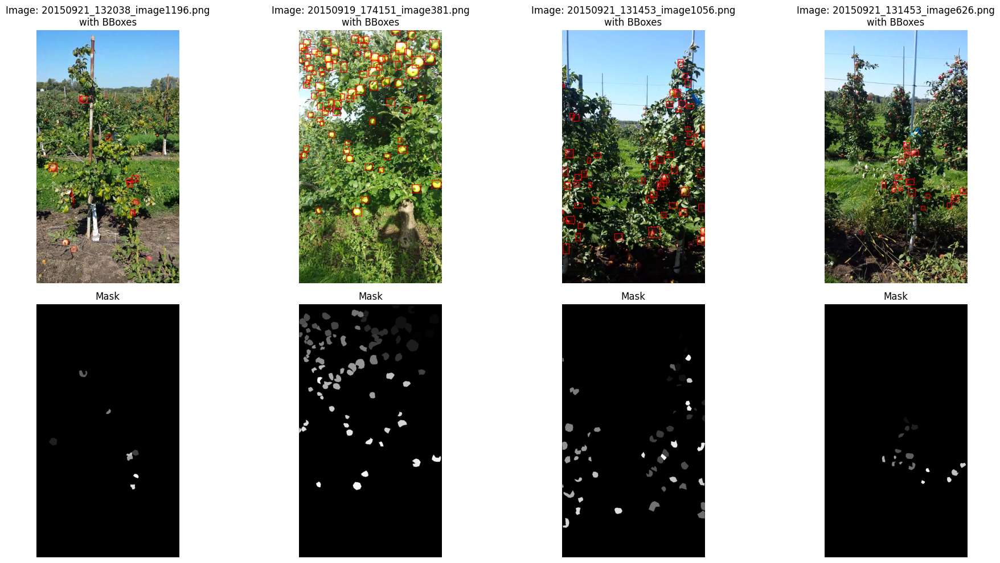

In [ ]:
import os
import random
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np

ROOT_DIR = "/content/gdrive/MyDrive/Hugging Face/datasets/MinneApple/detection"
TRAIN_SPLIT = os.path.join(ROOT_DIR, "train_split")
IMAGE_DIR = os.path.join(TRAIN_SPLIT, "images")
MASK_DIR = os.path.join(TRAIN_SPLIT, "masks")
JSON_PATH = os.path.join(ROOT_DIR, "instances_train.json")

# Load COCO annotations
with open(JSON_PATH) as f:
    coco = json.load(f)

# Build dict: image_id -> list of bboxes
image_id_to_bboxes = {}
for ann in coco['annotations']:
    image_id_to_bboxes.setdefault(ann['image_id'], []).append(ann['bbox'])

# Build dict: image_id -> file_name
image_id_to_name = {img['id']: img['file_name'] for img in coco['images']}

# Randomly select 4 image_ids
random.seed(40)
sample_image_ids = random.sample(list(image_id_to_name.keys()), 4)

fig, axs = plt.subplots(2, 4, figsize=(20, 10))

for i, img_id in enumerate(sample_image_ids):
    img_name = image_id_to_name[img_id]
    img_path = os.path.join(IMAGE_DIR, img_name)
    mask_path = os.path.join(MASK_DIR, os.path.splitext(img_name)[0] + ".png")

    # Load image and mask
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Count bboxes in JSON for this image
    bbox_count = len(image_id_to_bboxes.get(img_id, []))
    # Count unique apple instances in mask (exclude background=0)
    unique_instances = len(np.unique(mask)) - (1 if 0 in np.unique(mask) else 0)

    print(f"Image: {img_name}")
    print(f"  BBoxes count from JSON: {bbox_count}")
    print(f"  Unique instances in mask: {unique_instances}")

    # Draw bboxes on image copy
    img_with_boxes = img.copy()
    for bbox in image_id_to_bboxes.get(img_id, []):
        x, y, w, h = map(int, bbox)
        cv2.rectangle(img_with_boxes, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Plot original image with bboxes
    axs[0, i].imshow(img_with_boxes)
    axs[0, i].axis('off')
    axs[0, i].set_title(f"Image: {img_name}\nwith BBoxes")

    # Plot original mask
    axs[1, i].imshow(mask, cmap='gray')
    axs[1, i].axis('off')
    axs[1, i].set_title("Mask")

plt.tight_layout()
plt.show()

In [ ]:
!pip install -U 'git+https://github.com/facebookresearch/detectron2.git'

In [5]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

In [6]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, message=".*torch.cuda.amp.autocast.*")

In [7]:
from detectron2.data.datasets import register_coco_instances
import os

data_dir = "datasets/MinneApple/detection"

register_coco_instances("Apple_train", {},
                        os.path.join(data_dir, "instances_train.json"),
                        os.path.join(data_dir, "train_split/images"))

register_coco_instances("Apple_val", {},
                        os.path.join(data_dir, "instances_val.json"),
                        os.path.join(data_dir, "val_split/images"))

In [8]:
from detectron2.config import get_cfg
from detectron2 import model_zoo

cfg = get_cfg()

cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")

# Dataset
cfg.DATASETS.TRAIN = ("Apple_train",)
cfg.DATASETS.TEST = ("Apple_val",)
cfg.INPUT.MIN_SIZE_TRAIN = (1024, 1152, 1280)
cfg.INPUT.MAX_SIZE_TRAIN = 2048

cfg.INPUT.MIN_SIZE_TEST = 1280
cfg.INPUT.MAX_SIZE_TEST = 2048
cfg.DATALOADER.NUM_WORKERS = 8

# Training setup
cfg.SOLVER.IMS_PER_BATCH = 12
num_images = 536
epochs = 40
iters_per_epoch = num_images // cfg.SOLVER.IMS_PER_BATCH
cfg.SOLVER.MAX_ITER = iters_per_epoch * epochs
# Dynamic LR step schedule (50% and 80% of total iters)
cfg.SOLVER.BASE_LR = 0.00025

cfg.SOLVER.STEPS = (
    int(cfg.SOLVER.MAX_ITER * 0.5),
    int(cfg.SOLVER.MAX_ITER * 0.8)
)
# Evaluate every 5 epochs
cfg.TEST.EVAL_PERIOD = iters_per_epoch * 2 # 5 epoch
cfg.SOLVER.GAMMA = 0.1
warmup_iters = min(200, int(iters_per_epoch * 2))
cfg.SOLVER.WARMUP_ITERS = warmup_iters

cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8, 16, 32, 64, 128]]  # add smaller sizes
cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[0.25, 0.5, 1.0, 2.0]]

cfg.MODEL.RETINANET.NUM_CLASSES = 1
cfg.SOLVER.AMP.ENABLED = True  # Enable automatic mixed precision for speedup

cfg.SOLVER.CHECKPOINT_PERIOD = 200
cfg.OUTPUT_DIR = "/content/.cache/detectron2_RetinaNet_Apple"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [9]:
from detectron2.engine import hooks
from detectron2.evaluation import inference_on_dataset
import torch
import math

class BestModelSaver(hooks.EvalHook):
    def __init__(self, eval_period, model, evaluator, val_loader, save_path):
        super().__init__(eval_period, self.eval_function)
        self.model = model
        self.evaluator = evaluator
        self.val_loader = val_loader
        self.save_path = save_path
        self.best_ap = -1.0

    def eval_function(self):
        results = inference_on_dataset(self.model, self.val_loader, self.evaluator)
        bbox_results = results.get("bbox") if results else None

        if bbox_results and "AP" in bbox_results:
            curr_ap = bbox_results["AP"]
            if curr_ap is not None and not math.isnan(curr_ap):
                print(f"📈 Eval AP: {curr_ap:.4f} | Best so far: {self.best_ap:.4f}")
                if curr_ap > self.best_ap:
                    print(f"🥇 New best model! Saving to {self.save_path}")
                    torch.save(self.model.state_dict(), self.save_path)
                    self.best_ap = curr_ap
            else:
                print(f"⚠️ AP is NaN or invalid (value: {curr_ap}), skipping save.")
        else:
            print("⚠️ No valid bbox/AP results found in evaluation output.")

        return results

In [10]:
# Patch COCOEvaluator to avoid missing fields crash:
from pycocotools.coco import COCO
import copy
import json
import time

def patched_loadRes(self, resFile):
    tic = time.time()
    self.dataset.setdefault("info", {})
    self.dataset.setdefault("licenses", [])
    if isinstance(resFile, str):
        with open(resFile, 'r') as f:
            anns = json.load(f)
    elif isinstance(resFile, list):
        anns = resFile
    else:
        raise TypeError('resFile must be a file path or list of dicts')

    res = COCO()
    res.dataset['info'] = copy.deepcopy(self.dataset['info'])
    res.dataset['licenses'] = copy.deepcopy(self.dataset['licenses'])
    res.dataset['images'] = copy.deepcopy(self.dataset['images'])

    assert isinstance(anns, list), 'Annotations must be a list'
    anns_img_ids = [ann['image_id'] for ann in anns]
    assert set(anns_img_ids).issubset(set(self.getImgIds()))

    for idx, ann in enumerate(anns):
        ann.setdefault('id', idx + 1)
        if 'area' not in ann:
            if 'bbox' in ann:
                _, _, w, h = ann['bbox']
                ann['area'] = w * h
            else:
                ann['area'] = 0

    res.dataset['annotations'] = anns
    res.createIndex()
    print(f'Annotations loaded in {time.time() - tic:.2f}s')
    return res

COCO.loadRes = patched_loadRes

In [11]:
from detectron2.engine import DefaultTrainer
from detectron2.data import build_detection_test_loader
from detectron2.evaluation import COCOEvaluator

trainer = DefaultTrainer(cfg)
val_loader = build_detection_test_loader(cfg, "Apple_val")
evaluator = COCOEvaluator("Apple_val", cfg, False, output_dir=cfg.OUTPUT_DIR)

best_model_path = "/content/gdrive/MyDrive/Hugging Face/datasets/MinneApple/best_retinanet_model.pth"

trainer.register_hooks([
    BestModelSaver(cfg.TEST.EVAL_PERIOD, trainer.model, evaluator, val_loader, best_model_path)
])

[02/09 19:47:21 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/detectron2/engine/train_loop.py:471: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  grad_scaler = GradScaler()


In [ ]:
torch.cuda.empty_cache()

In [ ]:
trainer.resume_or_load(resume=False)
trainer.train()

[07/08 16:26:09 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/retinanet_R_101_FPN_3x/190397697/model_final_971ab9.pkl ...


head.bbox_pred.{bias, weight}
head.cls_score.{bias, weight}
  pixel_mean
  pixel_std


[07/08 16:26:10 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:227: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


[07/08 16:27:02 d2.utils.events]:  eta: 1:14:24  iter: 19  total_loss: 2.699  loss_cls: 1.597  loss_box_reg: 1.102    time: 2.5779  last_time: 2.7446  data_time: 0.0700  last_data_time: 0.0334   lr: 5.4173e-05  max_mem: 21865M
[07/08 16:27:53 d2.utils.events]:  eta: 1:13:58  iter: 39  total_loss: 1.428  loss_cls: 0.7428  loss_box_reg: 0.6628    time: 2.5776  last_time: 2.5891  data_time: 0.0406  last_data_time: 0.0421   lr: 0.00011093  max_mem: 21865M
[07/08 16:28:46 d2.utils.events]:  eta: 1:13:19  iter: 59  total_loss: 1.154  loss_cls: 0.4582  loss_box_reg: 0.697    time: 2.5902  last_time: 2.5856  data_time: 0.0408  last_data_time: 0.0363   lr: 0.0001677  max_mem: 21865M
[07/08 16:29:37 d2.utils.events]:  eta: 1:12:27  iter: 79  total_loss: 0.9751  loss_cls: 0.3603  loss_box_reg: 0.631    time: 2.5903  last_time: 2.6462  data_time: 0.0402  last_data_time: 0.0448   lr: 0.00022446  max_mem: 21865M
[07/08 16:29:58 d2.data.datasets.coco]: Loaded 134 images in COCO format from datasets/M

In [ ]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.data import build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2 import model_zoo
import os

# 🔧 Setup config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.DATALOADER.NUM_WORKERS = 8
cfg.MODEL.WEIGHTS = "datasets/MinneApple/best_retinanet_model.pth"  # Your best model
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.1  # confidence threshold
cfg.MODEL.RETINANET.NUM_CLASSES = 1
cfg.INPUT.MIN_SIZE_TEST = 1280  # ← same as training
cfg.INPUT.MAX_SIZE_TEST = 2048  # ← same as training
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8, 16, 32, 64, 128]]  # ← same as training
cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[0.25, 0.5, 1.0, 2.0]]  # ← same
cfg.SOLVER.AMP.ENABLED = True
cfg.OUTPUT_DIR = "/content/.cache/detectron2_RetinaNet_Apple"

# 🧪 Run evaluation
evaluator = COCOEvaluator("Apple_val", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "Apple_val")
results = inference_on_dataset(DefaultPredictor(cfg).model, val_loader, evaluator)

print("\n📊 Evaluation Results on Saved Best Model:")
print(results)

WARNING [07/08 18:07:17 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[07/08 18:07:17 d2.data.datasets.coco]: Loaded 134 images in COCO format from datasets/MinneApple/detection/instances_val.json
[07/08 18:07:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(1280, 1280), max_size=2048, sample_style='choice')]
[07/08 18:07:17 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/08 18:07:17 d2.data.common]: Serializing 134 elements to byte tensors and concatenating them all ...
[07/08 18:07:17 d2.data.common]: Serialized dataset takes 0.20 MiB
[07/08 18:07:18 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from datasets/MinneApple/best_retinanet_model.pth ...
[07/08 18:07:19 d2.evaluation.evaluator]: Start inference on 134 batches
[07/08 18:07:20 d2.e

In [ ]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.data import build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
import json
import numpy as np
import os

def iou(boxA, boxB):
    # Convert [x1,y1,x2,y2]
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2]-boxA[0])*(boxA[3]-boxA[1])
    boxBArea = (boxB[2]-boxB[0])*(boxB[3]-boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea + 1e-6)
    return iou

def simple_prf1(gt_annotations, pred_annotations, iou_threshold=0.5, score_threshold=0.4):
    # Group GT and preds by image_id
    gt_by_img = {}
    for ann in gt_annotations:
        gt_by_img.setdefault(ann['image_id'], []).append(ann['bbox'])

    pred_by_img = {}
    for ann in pred_annotations:
        if ann.get('score', 1.0) >= score_threshold:
            pred_by_img.setdefault(ann['image_id'], []).append(ann['bbox'])

    TP = 0
    FP = 0
    FN = 0

    for img_id, gt_boxes in gt_by_img.items():
        preds = pred_by_img.get(img_id, [])
        gt_used = [False]*len(gt_boxes)

        preds_xyxy = [[x, y, x+w, y+h] for x,y,w,h in preds]
        gt_xyxy = [[x, y, x+w, y+h] for x,y,w,h in gt_boxes]

        for pred_box in preds_xyxy:
            matched = False
            for i, gt_box in enumerate(gt_xyxy):
                if not gt_used[i] and iou(pred_box, gt_box) >= iou_threshold:
                    TP += 1
                    gt_used[i] = True
                    matched = True
                    break
            if not matched:
                FP += 1

        FN += gt_used.count(False)

    precision = TP / (TP + FP + 1e-8) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN + 1e-8) if (TP + FN) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall + 1e-8) if (precision + recall) > 0 else 0

    print(f"📊 Precision: {precision:.4f}")
    print(f"📊 Recall:    {recall:.4f}")
    print(f"📊 F1 Score:  {f1:.4f}")

def evaluate_prf1_best(cfg, dataset_name, model_weights, iou_thresh=0.5, score_thresh=0.4):
    cfg.MODEL.WEIGHTS = model_weights
    predictor = DefaultPredictor(cfg)

    output_dir = cfg.OUTPUT_DIR
    evaluator = COCOEvaluator(dataset_name, cfg, False, output_dir=output_dir)
    val_loader = build_detection_test_loader(cfg, dataset_name)

    print("🔍 Running inference and saving predictions...")
    inference_on_dataset(predictor.model, val_loader, evaluator)

    annotation_file = "datasets/MinneApple/detection/instances_val.json"
    prediction_file = os.path.join(output_dir, "coco_instances_results.json")

    if not os.path.exists(prediction_file):
        raise FileNotFoundError(f"Prediction file not found at: {prediction_file}")

    with open(annotation_file) as f:
        gt_data = json.load(f)
    with open(prediction_file) as f:
        pred_data = json.load(f)

    simple_prf1(
        gt_data['annotations'],
        pred_data,
        iou_threshold=iou_thresh,
        score_threshold=score_thresh,
    )

# Example usage (adjust paths as needed)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = "datasets/MinneApple/best_retinanet_model.pth"
cfg.MODEL.RETINANET.NUM_CLASSES = 1
cfg.TEST.DETECTIONS_PER_IMAGE = 200
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.4 # optimal
cfg.MODEL.RETINANET.NMS_THRESH_TEST = 0.3
cfg.INPUT.MIN_SIZE_TEST = 1280
cfg.INPUT.MAX_SIZE_TEST = 2048
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8, 16, 32, 64, 128]]
cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[0.25, 0.5, 1.0, 2.0]]
cfg.DATALOADER.NUM_WORKERS = 8
cfg.SOLVER.AMP.ENABLED = True
cfg.OUTPUT_DIR = "/content/.cache/detectron2_RetinaNet_Apple"

evaluate_prf1_best(cfg, "Apple_val", cfg.MODEL.WEIGHTS)

[07/17 16:45:17 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from datasets/MinneApple/best_retinanet_model.pth ...
WARNING [07/17 16:45:17 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[07/17 16:45:17 d2.data.datasets.coco]: Loaded 134 images in COCO format from datasets/MinneApple/detection/instances_val.json
[07/17 16:45:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(1280, 1280), max_size=2048, sample_style='choice')]
[07/17 16:45:17 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/17 16:45:17 d2.data.common]: Serializing 134 elements to byte tensors and concatenating them all ...
[07/17 16:45:17 d2.data.common]: Serialized dataset takes 0.20 MiB
🔍 Running inference and saving predictions...
[07/17 16:45:17 d2.evaluation.evaluator]: Start

In [12]:
import random
import cv2
import matplotlib.pyplot as plt
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.data import MetadataCatalog, DatasetCatalog
import math
import torch

def run_gt_vs_result_comparison(num_images):
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
    cfg.MODEL.WEIGHTS = "datasets/MinneApple/best_retinanet_model.pth"
    cfg.MODEL.DEVICE = "cuda"
    cfg.MODEL.RETINANET.NUM_CLASSES = 1
    cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.4
    cfg.MODEL.RETINANET.NMS_THRESH_TEST = 0.3
    cfg.TEST.DETECTIONS_PER_IMAGE = 200
    cfg.INPUT.MIN_SIZE_TEST = 1280
    cfg.INPUT.MAX_SIZE_TEST = 2048
    cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8, 16, 32, 64, 128]]
    cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[0.25, 0.5, 1.0, 2.0]]

    predictor = DefaultPredictor(cfg)

    # Colors
    color_gt = (255, 0, 0)     # Red for GT
    color_pred = (0, 255, 255)   # Cyan for Prediction

    metadata = MetadataCatalog.get("Apple_val")
    dataset_dicts = DatasetCatalog.get("Apple_val")
    sampled_dicts = random.sample(dataset_dicts, num_images)

    cols = 8  # fixed 8 cols: pairs GT|Result|GT|Result|...
    rows = math.ceil(num_images / (cols // 2))  # because each image takes 2 cols

    plt.figure(figsize=(cols * 3, rows * 3))

    for idx, d in enumerate(sampled_dicts):
        img_path = d["file_name"]
        img = cv2.imread(img_path)
        img_rgb = img[:, :, ::-1].copy()

        # Ground truth boxes from json annotations
        gt_boxes = [ann["bbox"] for ann in d["annotations"]] if "annotations" in d else []
        # COCO bbox format is [x, y, width, height], convert to x1,y1,x2,y2
        gt_boxes_xyxy = []
        for b in gt_boxes:
            x1, y1, w, h = b
            gt_boxes_xyxy.append([int(x1), int(y1), int(x1 + w), int(y1 + h)])

        # Prediction
        outputs = predictor(img)
        instances = outputs["instances"].to("cpu")
        pred_boxes = instances.pred_boxes if instances.has("pred_boxes") else None
        scores = instances.scores if instances.has("scores") else None

        # Filter by score threshold
        keep = scores > cfg.MODEL.RETINANET.SCORE_THRESH_TEST
        pred_boxes = pred_boxes[keep]

        # Draw GT boxes on original image copy (left image)
        img_gt = img_rgb.copy()
        for box in gt_boxes_xyxy:
            cv2.rectangle(img_gt, (box[0], box[1]), (box[2], box[3]), color_gt, thickness=4)

        # Draw predicted boxes on original image copy (right image)
        img_pred = img_rgb.copy()
        for box in pred_boxes.tensor.numpy():
            x1, y1, x2, y2 = box.astype(int)
            cv2.rectangle(img_pred, (x1, y1), (x2, y2), color_pred, thickness=4)

        # Plot GT image
        plt.subplot(rows, cols, idx * 2 + 1)
        plt.imshow(img_gt)
        plt.axis("off")
        plt.title(f"GT count: {len(gt_boxes_xyxy)}")

        # Plot prediction image
        plt.subplot(rows, cols, idx * 2 + 2)
        plt.imshow(img_pred)
        plt.axis("off")
        plt.title(f"Pred count: {len(pred_boxes)}")

    plt.tight_layout()
    plt.show()

[07/08 20:46:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from datasets/MinneApple/best_retinanet_model.pth ...
[07/08 20:46:28 d2.data.datasets.coco]: Loaded 134 images in COCO format from datasets/MinneApple/detection/instances_val.json


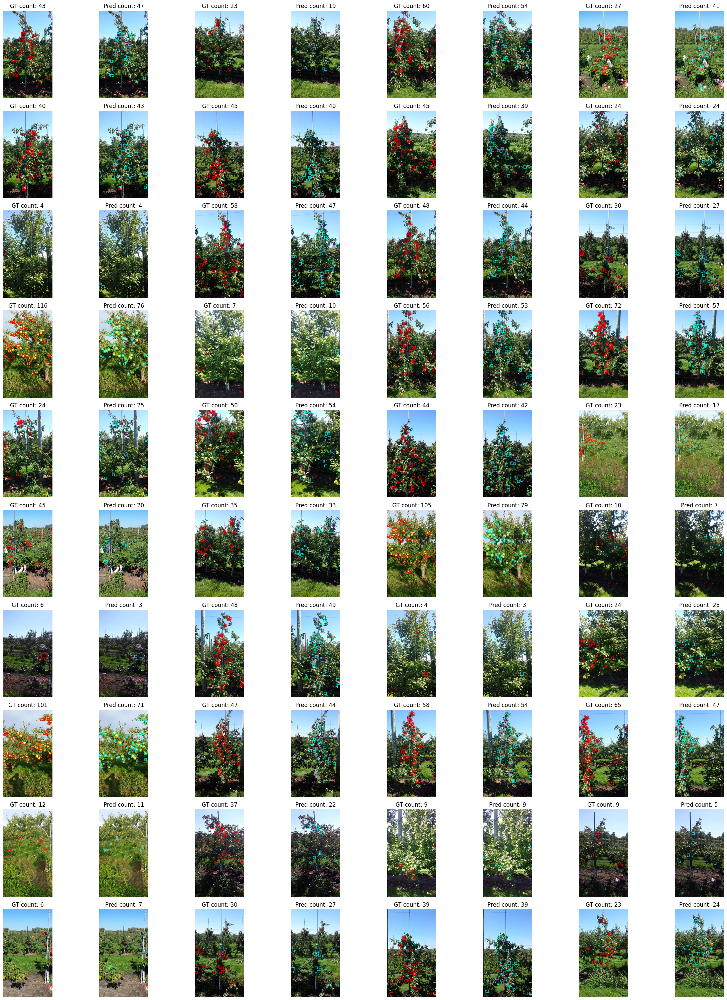

In [ ]:
run_gt_vs_result_comparison(40)

[02/09 19:49:42 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from datasets/MinneApple/best_retinanet_model.pth ...
[02/09 19:49:52 d2.data.datasets.coco]: Loaded 134 images in COCO format from datasets/MinneApple/detection/instances_val.json


/usr/local/lib/python3.12/dist-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4317.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


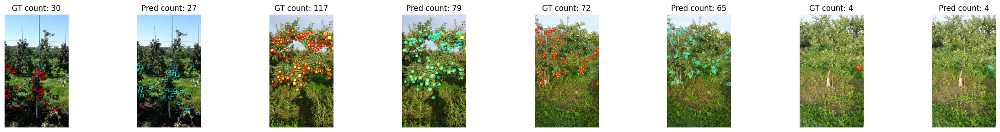

In [13]:
run_gt_vs_result_comparison(4)

In [28]:
from detectron2.modeling import build_model
from detectron2.export import TracingAdapter
from detectron2.checkpoint import DetectionCheckpointer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = "datasets/MinneApple/best_retinanet_model.pth"
cfg.MODEL.DEVICE = "cpu"
cfg.MODEL.RETINANET.NUM_CLASSES = 1
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.4
cfg.MODEL.RETINANET.NMS_THRESH_TEST = 0.3
cfg.TEST.DETECTIONS_PER_IMAGE = 200
cfg.INPUT.MIN_SIZE_TEST = 1280
cfg.INPUT.MAX_SIZE_TEST = 2048
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8, 16, 32, 64, 128]]
cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[0.25, 0.5, 1.0, 2.0]]

model = build_model(cfg)
model.eval()

checkpointer = DetectionCheckpointer(model)
checkpointer.load("datasets/MinneApple/best_retinanet_model.pth")

[02/09 20:23:55 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from datasets/MinneApple/best_retinanet_model.pth ...


{}

In [16]:
!pip install onnx onnxscript

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 34.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 59.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.7/148.7 kB 4.9 MB/s eta 0:00:00


In [29]:
# Detectron2 models take a list of dicts: [{"image": tensor}]
inputs = [{"image": torch.randn(3, 640, 640).to(cfg.MODEL.DEVICE)}]

# 3. Wrap the model with TracingAdapter
# This "flattens" the input/output so torch.onnx.export can understand it
adapter = TracingAdapter(model, inputs)

# 4. Use the adapter's flattened inputs for the export
dummy_inputs = adapter.flattened_inputs
onnx_model_path = "datasets/MinneApple/best_retinanet_model.onnx"
torch.onnx.export(
    adapter,               # Export the adapter, not the raw model
    dummy_inputs,          # Use the flattened inputs
    onnx_model_path,
    opset_version=13,
    export_params=True,
    dynamo=False,        # Use legacy exporter to avoid strict tracing issues
    input_names=["input"],
    output_names=["boxes", "labels", "scores"],
    do_constant_folding=True,
)
print(f"ONNX export {onnx_model_path} completed successfully!")

/tmp/ipython-input-2401984678.py:11: DeprecationWarning: You are using the legacy TorchScript-based ONNX export. Starting in PyTorch 2.9, the new torch.export-based ONNX exporter will be the default. To switch now, set dynamo=True in torch.onnx.export. This new exporter supports features like exporting LLMs with DynamicCache. We encourage you to try it and share feedback to help improve the experience. Learn more about the new export logic: https://pytorch.org/docs/stable/onnx_dynamo.html. For exporting control flow: https://pytorch.org/tutorials/beginner/onnx/export_control_flow_model_to_onnx_tutorial.html.
  torch.onnx.export(
/usr/local/lib/python3.12/dist-packages/detectron2/structures/image_list.py:86: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert t.shape[:

ONNX export datasets/MinneApple/best_retinanet_model.onnx completed successfully!


In [25]:
!pip install onnxruntime-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.6/252.6 MB 5.6 MB/s eta 0:00:00


In [33]:
import onnxruntime
import numpy as np
import cv2
import torch

# Load image and preprocess (assume 640x640)
img_path = "datasets/MinneApple/detection/val_split/images/20150919_174151_image231.png"

img = cv2.imread(img_path)
img_resized = cv2.resize(img, (640, 640))
img_input = img_resized.astype(np.float32)
img_input = img_input.transpose(2, 0, 1)  # Result: (3, 640, 640)

# Run inference
session = onnxruntime.InferenceSession("datasets/MinneApple/best_retinanet_model.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name
outputs = session.run(None, {input_name: img_input})

# outputs is a list, often like [boxes, scores, keypoints]
print("Output:", [o.shape for o in outputs])

Output: [(22, 4), (22,), (22,), (2,)]


[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0.7555426  0.753732   0.7110034  0.65477204 0.6272146  0.60549086
 0.5910972  0.5785744  0.57220274 0.57205784 0.57192165 0.53906184
 0.52905846 0.49550366 0.47997165 0.47454864 0.46988016 0.4670171
 0.44180566 0.432831   0.43032718 0.42795938]


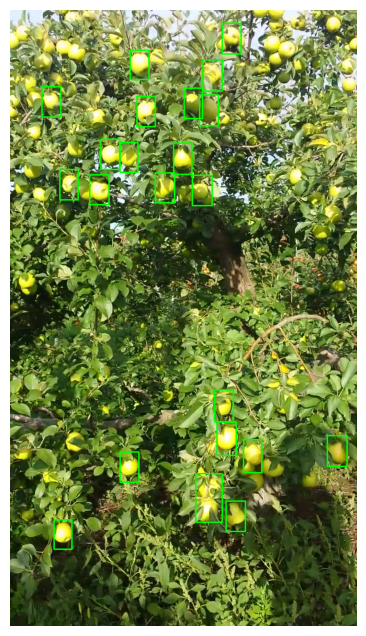

In [35]:
import torch
from torchvision.ops import nms
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Unpack outputs correctly
boxes, labels, scores, metainfo = outputs

# Convert to numpy arrays if needed
boxes = np.array(boxes)
labels = np.array(labels)
scores = np.array(scores)

# Apply NMS
boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
scores_tensor = torch.tensor(scores, dtype=torch.float32)
nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold=0.5)

# Filter after NMS
boxes = boxes_tensor[nms_indices].numpy()
scores = scores_tensor[nms_indices].numpy()
print(labels)
print(scores)

# Resize back to original scale
h_orig, w_orig = img.shape[:2]
scale_x = w_orig / 640  # width scale
scale_y = h_orig / 640  # height scale

conf_thr = 0.3

for i in range(len(scores)):
    if scores[i] < conf_thr:
        continue

    # Draw bounding box
    x1, y1, x2, y2 = boxes[i]
    x1 = int(x1 * scale_x)
    y1 = int(y1 * scale_y)
    x2 = int(x2 * scale_x)
    y2 = int(y2 * scale_y)

    x1 = max(0, min(x1, w_orig - 1))
    y1 = max(0, min(y1, h_orig - 1))
    x2 = max(0, min(x2, w_orig - 1))
    y2 = max(0, min(y2, h_orig - 1))

    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Show result
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

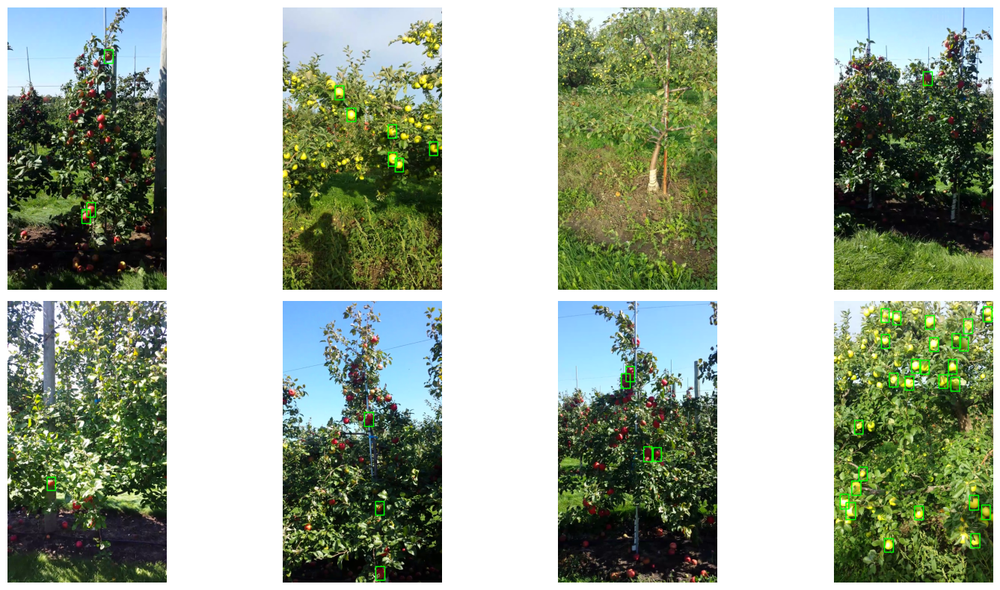

In [42]:
# class names
label_list= ["Apple"]

session = onnxruntime.InferenceSession("datasets/MinneApple/best_retinanet_model.onnx", providers=["CUDAExecutionProvider"])
input_name = session.get_inputs()[0].name

# ---------------- CONFIG ----------------
val_dir = "datasets/MinneApple/detection/val_split/images/"

# visualization layout
N = 8
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(val_dir, f)
            for f in os.listdir(val_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(sample_imgs):
    plt.subplot(2, 4, i+1)

    img = cv2.imread(image)
    img_resized = cv2.resize(img, (640, 640))
    img_input = img_resized.astype(np.float32)
    img_input = img_input.transpose(2, 0, 1)

    outputs = session.run(None, {input_name: img_input})

    boxes, labels, scores, metainfo = outputs

    # Convert to numpy arrays if needed
    boxes = np.array(boxes)
    labels = np.array(labels)
    scores = np.array(scores)

    # Apply NMS
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)
    nms_indices = nms(boxes_tensor, scores_tensor, iou_threshold=0.5)

    # Filter after NMS
    boxes = boxes_tensor[nms_indices].numpy()
    scores = scores_tensor[nms_indices].numpy()

    # Resize back to original scale
    h_orig, w_orig = img.shape[:2]
    scale_x = w_orig / 640  # width scale
    scale_y = h_orig / 640  # height scale

    conf_thr = 0.1

    for ii in range(len(scores)):
        if scores[ii] < conf_thr:
            continue

        label = label_list[labels[ii]]
        score = scores[ii]

        # Draw bounding box
        x1, y1, x2, y2 = boxes[ii]
        x1 = int(x1 * scale_x)
        y1 = int(y1 * scale_y)
        x2 = int(x2 * scale_x)
        y2 = int(y2 * scale_y)

        x1 = max(0, min(x1, w_orig - 1))
        y1 = max(0, min(y1, h_orig - 1))
        x2 = max(0, min(x2, w_orig - 1))
        y2 = max(0, min(y2, h_orig - 1))

        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)

        # draw label and score
        # text = f"{label}: {score:.2f}"
        # cv2.putText(img, text, (x1, y1 - 15), cv2.FONT_HERSHEY_SIMPLEX,
        #             1.3, (255, 255, 0), 3, cv2.LINE_AA)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")

plt.tight_layout()
plt.show()